In [8]:
from netCDF4 import Dataset
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

import numpy as np

In [9]:
def plot_globaly(plot_data,var,fsize,title,figfile,vmin,vmax):
    fig = plt.figure(figsize=(15,10))
    ax = plt.axes(projection=ccrs.PlateCarree())
    #ax.set_extent([-100,40,-34,80])
    ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '50m', edgecolor='face', facecolor='0.5'))
    ax.coastlines()
    ax.gridlines()

    plt.pcolormesh(lon,lat,plot_data,transform=ccrs.PlateCarree(),vmin=vmin,vmax=vmax,cmap=cmap)
    cb = plt.colorbar(extend='both',orientation='horizontal')
    cb.ax.tick_params(labelsize=fsize)
    cb.set_label(var,size=fsize)
    plt.title(title,fontsize=fsize)
    
    plt.show()

    fig.savefig(figfile,dpi=100,bbox_inches='tight', pad_inches=0.1)

In [15]:
datadir = '/gws/nopw/j04/acsis/jmecking/CMIP6/composites/'
figdir  = '210610'

EXP          = 'piControl'
var_ts       = 'max_lats'
var_field    = 'tos'
season_ts    = 'JJA'
season_field = 'MAM'

infile = (datadir + EXP + '_' + var_ts + '-' + season_ts + '_' + var_field + '-' + season_field +'_std.nc' )

In [16]:
# Read in information:

ncid   = Dataset(infile,'r')
lon    = ncid.variables['lon'][:]
lat    = ncid.variables['lat'][:]
lags   = ncid.variables['lags'][:]
models = ncid.variables['models'][:]
ncid.close()

nm = len(models)
nl = np.size(lags)

ACCESS-CM2_r1i1p1f1
ACCESS-ESM1-5_r1i1p1f1
BCC-CSM2-MR_r1i1p1f1
BCC-ESM1_r1i1p1f1
CAMS-CSM1-0_r1i1p1f1
CAS-ESM2-0_r1i1p1f1
CESM2_r1i1p1f1
CESM2-FV2_r1i1p1f1
problem CESM2-FV2_r1i1p1f1
CESM2-WACCM_r1i1p1f1
CESM2-WACCM-FV2_r1i1p1f1
CIESM_r1i1p1f1
CMCC-CM2-SR5_r1i1p1f1
CNRM-CM6-1_r1i1p1f2
CNRM-CM6-1-HR_r1i1p1f2
CNRM-ESM2-1_r1i1p1f2
CanESM5_r1i1p1f1
CanESM5_r1i1p2f1
EC-Earth3_r1i1p1f1
EC-Earth3-AerChem_r1i1p1f1
EC-Earth3-Veg_r1i1p1f1
EC-Earth3-Veg-LR_r1i1p1f1
FGOALS-f3-L_r1i1p1f1
FGOALS-g3_r1i1p1f1
FIO-ESM-2-0_r1i1p1f1
GFDL-CM4_r1i1p1f1
HadGEM3-GC31-LL_r1i1p1f1
HadGEM3-GC31-MM_r1i1p1f1
IPSL-CM6A-LR_r1i1p1f1
IPSL-CM6A-LR_r1i2p1f1
MCM-UA-1-0_r1i1p1f1
MIROC-ES2L_r1i1p1f2
MIROC6_r1i1p1f1
MPI-ESM-1-2-HAM_r1i1p1f1
MPI-ESM1-2-HR_r1i1p1f1
MPI-ESM1-2-LR_r1i1p1f1
MRI-ESM2-0_r1i1p1f1
NESM3_r1i1p1f1
problem NESM3_r1i1p1f1
NorESM2-MM_r1i1p1f1
UKESM1-0-LL_r1i1p1f2
37


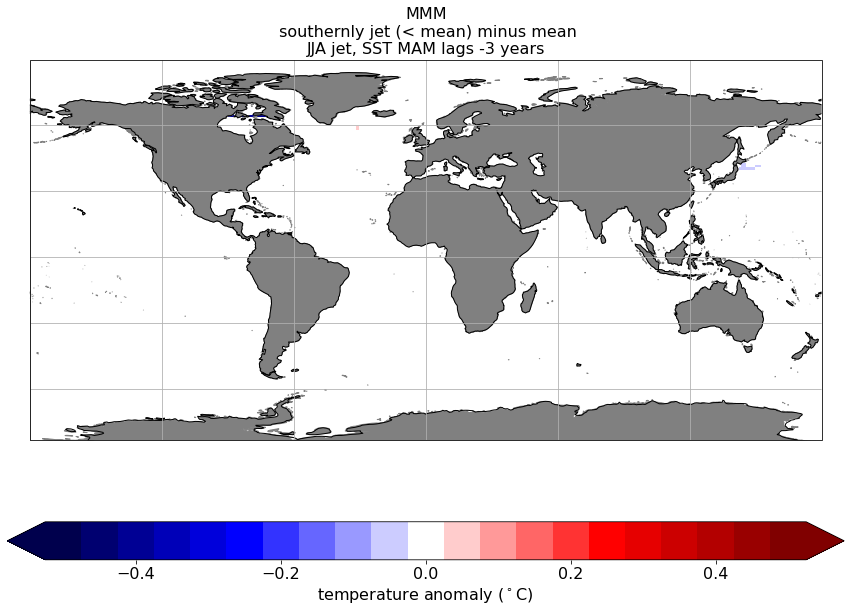

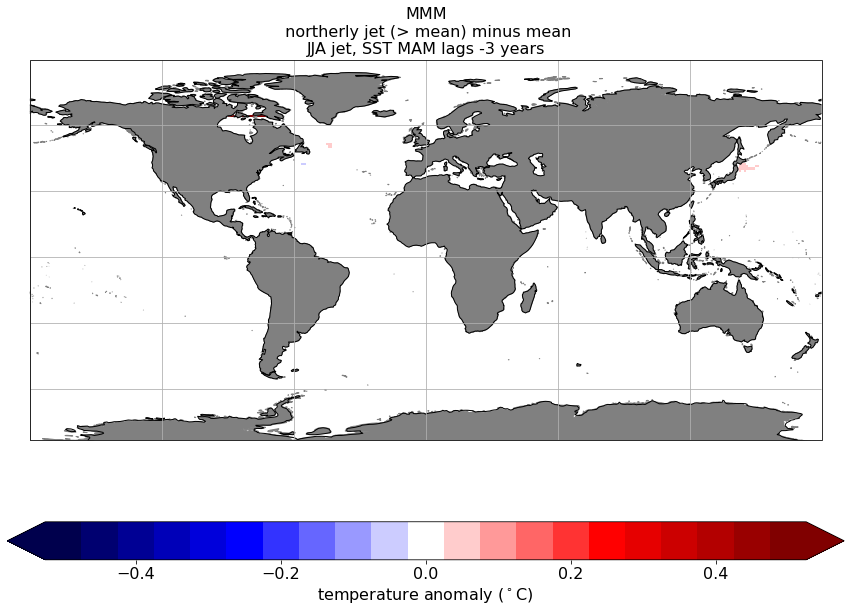

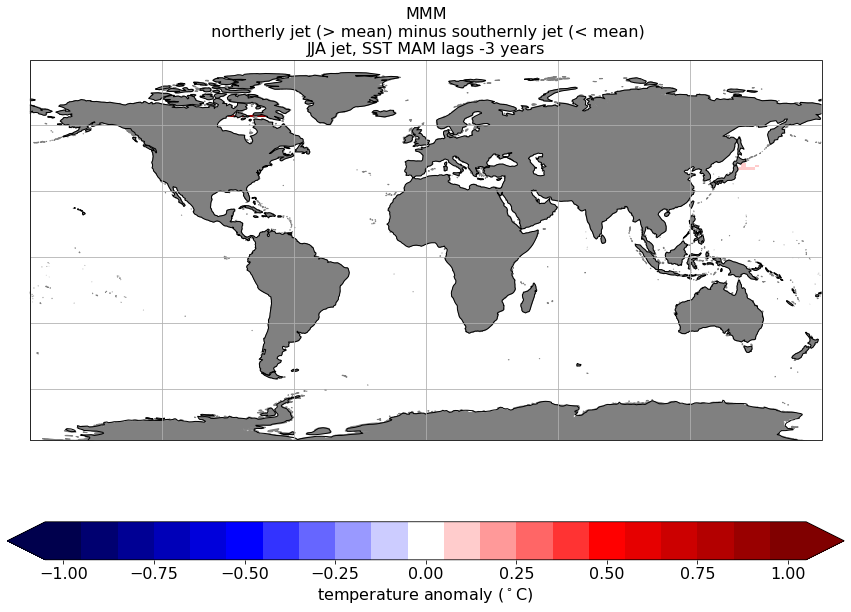

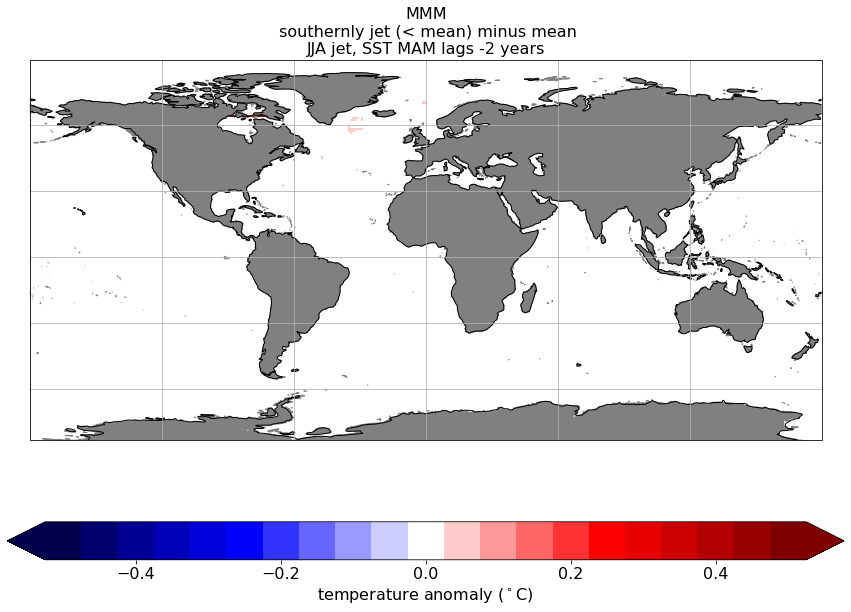

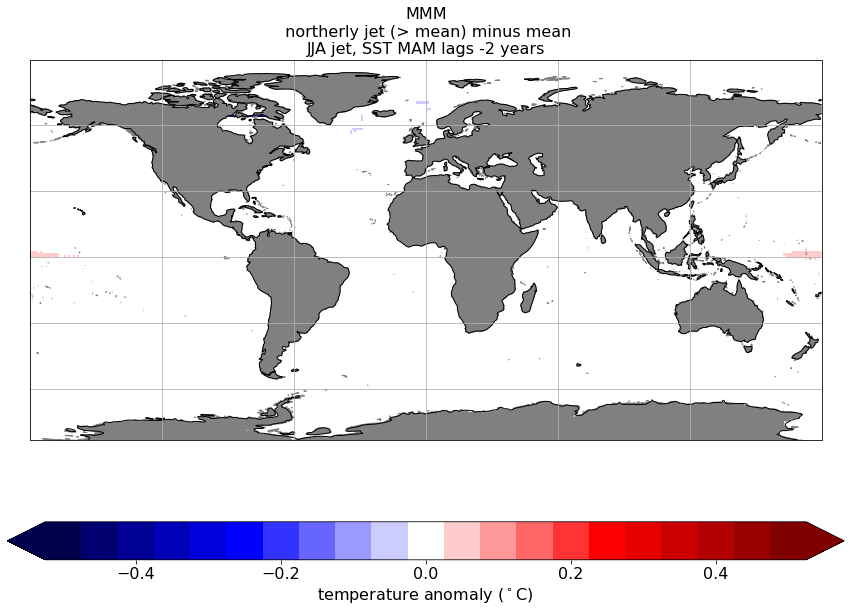

...

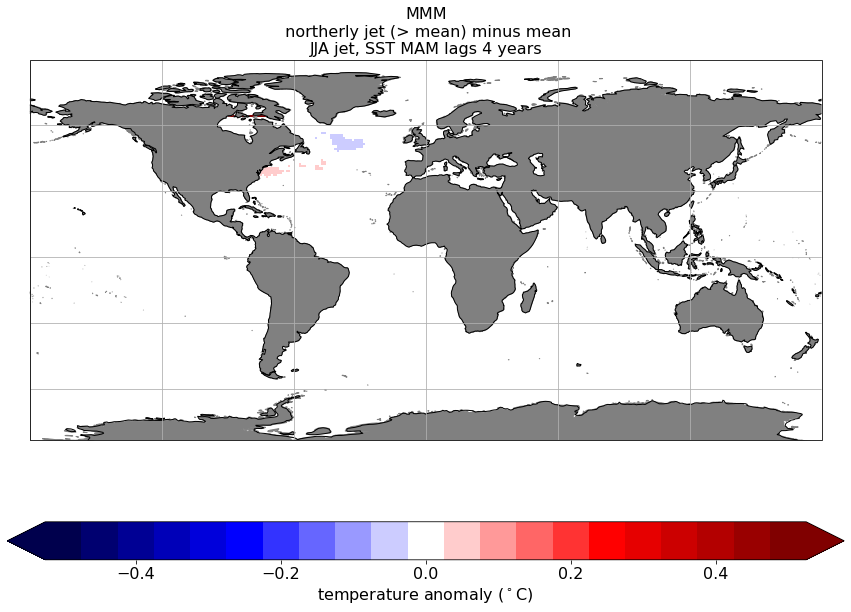

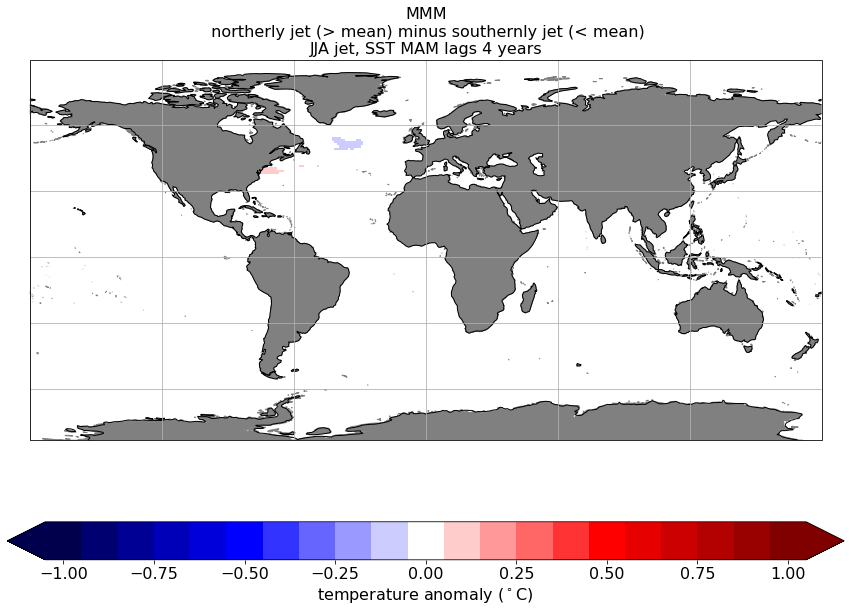

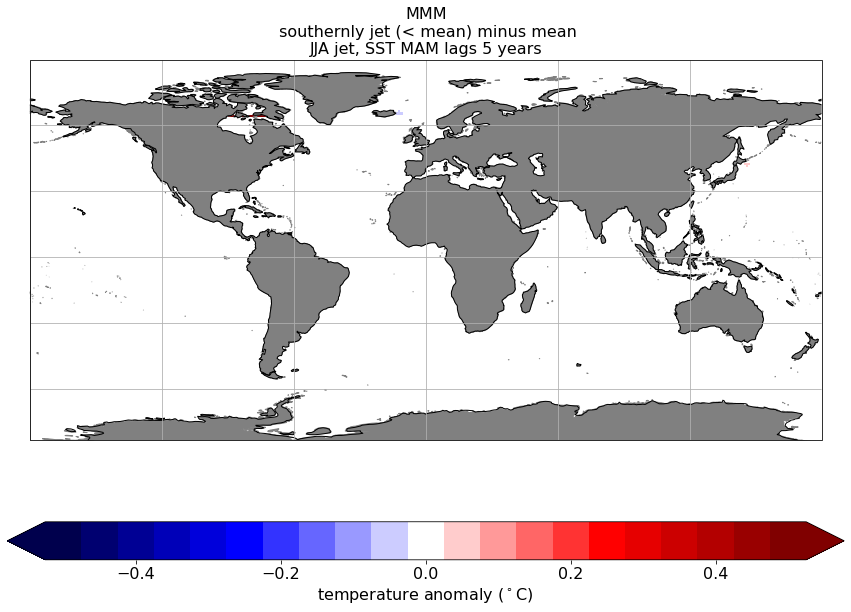

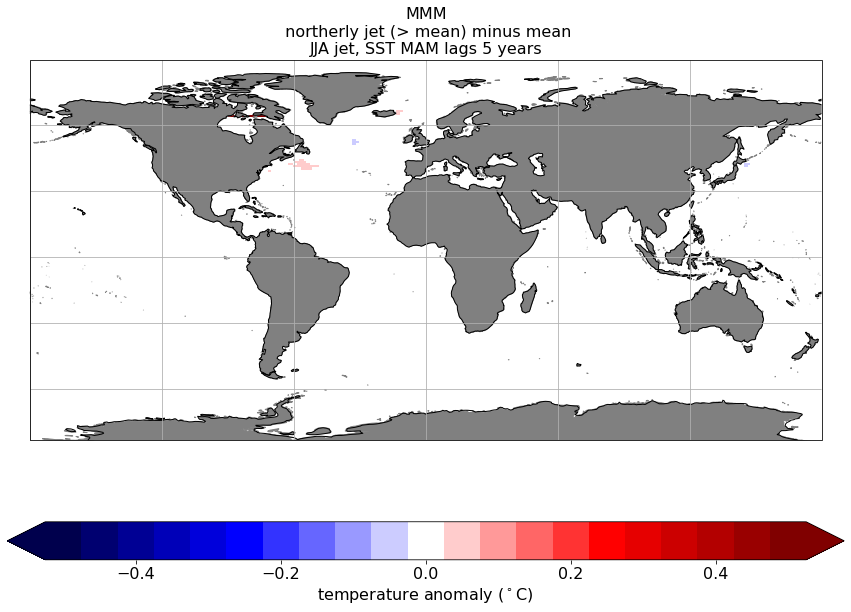

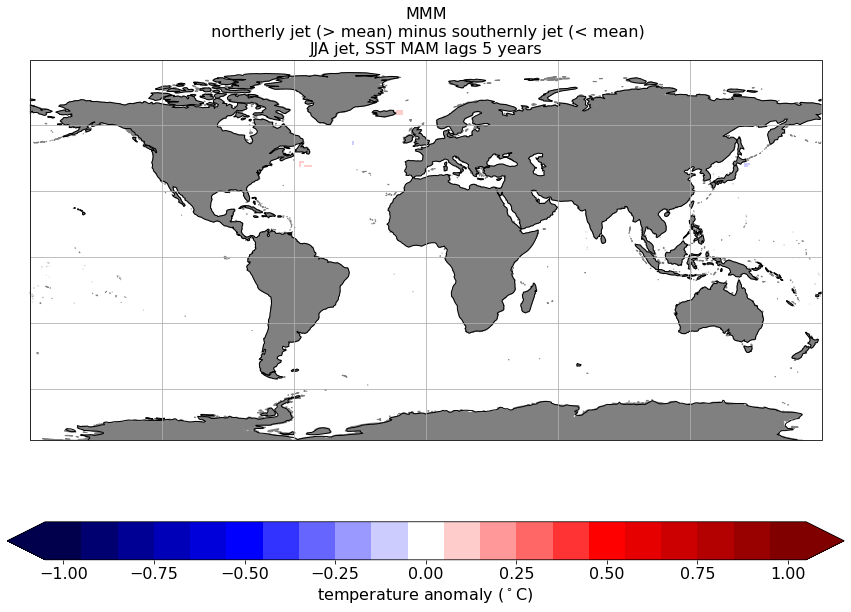

In [17]:
# Loop through each model and plot figures and save MMM:

cmap  = plt.get_cmap('seismic',21)
vmin  = -0.5*1.05
vmax  = 0.5*1.05
vmind = -1*1.05
vmaxd = 1*1.05

mean_MMM = np.zeros((np.size(lat),np.size(lon)),'float')
min0_MMM = np.zeros((np.size(lat),np.size(lon)),'float')
max0_MMM = np.zeros((np.size(lat),np.size(lon)),'float')

cc = 0
for mm in range(0,nm):
    print(models[mm])
    model = models[mm].split('_')[0]
    ENS   = models[mm].split('_')[1]
    
    ncid      = Dataset(infile,'r')
    data_mean = ncid.variables['mean'][mm,:,:]
    data_min0 = ncid.variables['min_std0'][mm,:,:,:]
    data_max0 = ncid.variables['max_std0'][mm,:,:,:]
    ncid.close()

    if ((models[mm] == 'CESM2-FV2_r1i1p1f1') | (models[mm] == 'NESM3_r1i1p1f1')):  # Problem with this model - need to investigate!
        print('problem ' + models[mm])
    else:
        cc = cc + 1
        mean_MMM = mean_MMM + data_mean
        min0_MMM = min0_MMM + data_min0
        max0_MMM = max0_MMM + data_max0
    # Plot individual models:
    '''
    for ll in range(0,nl):
        plot_globaly(data_min0[ll,:,:]-data_mean,'temperature anomaly ($^\circ$C)',16,
                     (model + ' ' + ENS + '\n southernly jet (< mean) minus mean\n' + season_ts +
                     ' jet, SST ' + season_field + ' lags ' + str(int(lags[ll])) + ' years'),
                     (figdir + '/' + models[mm] + '_' + var_ts + '-' + season_ts + '_' + var_field +
                     '-' + season_field + '_min-mean_0std_lag' + str(int(lags [ll])) + '.png'),vmin,vmax)

        plot_globaly(data_max0[ll,:,:]-data_mean,'temperature anomaly ($^\circ$C)',16,
                     (model + ' ' + ENS + '\n northerly jet (> mean) minus mean\n' + season_ts +
                     ' jet, SST ' + season_field + ' lags ' + str(int(lags[ll])) + ' years'),
                     (figdir + '/' + models[mm] + '_' + var_ts + '-' + season_ts + '_' + var_field +
                     '-' + season_field + '_max-mean_0std_lag' + str(int(lags [ll])) + '.png'),vmin,vmax)

        plot_globaly(data_max0[ll,:,:]-data_min0[ll,:,:],'temperature anomaly ($^\circ$C)',16,
                     (model + ' ' + ENS + '\n northerly jet (> mean) minus southernly jet (< mean)\n' + season_ts +
                     ' jet, SST ' + season_field + ' lags ' + str(int(lags[ll])) + ' years'),
                     (figdir + '/' + models[mm] + '_' + var_ts + '-' + season_ts + '_' + var_field +
                     '-' + season_field + '_max-min_0std_lag' + str(int(lags [ll])) + '.png'),vmind,vmaxd)
    '''
        

mean_MMM = mean_MMM/cc
min0_MMM = min0_MMM/cc
max0_MMM = max0_MMM/cc    
print(cc) 

# Plot multi-model mean:
for ll in range(0,nl):        
    plot_globaly(min0_MMM[ll,:,:]-mean_MMM,'temperature anomaly ($^\circ$C)',16,
                 ('MMM\n southernly jet (< mean) minus mean\n' + season_ts +
                 ' jet, SST ' + season_field + ' lags ' + str(int(lags[ll])) + ' years'),
                 (figdir + '/' + 'MMM_' + var_ts + '-' + season_ts + '_' + var_field +
                 '-' + season_field + '_min-mean_0std_lag' + str(int(lags [ll])) + '.png'),vmin,vmax)

    plot_globaly(max0_MMM[ll,:,:]-mean_MMM,'temperature anomaly ($^\circ$C)',16,
                 ('MMM\n northerly jet (> mean) minus mean\n' + season_ts +
                 ' jet, SST ' + season_field + ' lags ' + str(int(lags[ll])) + ' years'),
                 (figdir + '/' + 'MMM_' + var_ts + '-' + season_ts + '_' + var_field +
                 '-' + season_field + '_max-mean_0std_lag' + str(int(lags [ll])) + '.png'),vmin,vmax)

    plot_globaly(max0_MMM[ll,:,:]-min0_MMM[ll,:,:],'temperature anomaly ($^\circ$C)',16,
                 ('MMM\n northerly jet (> mean) minus southernly jet (< mean)\n' + season_ts +
                 ' jet, SST ' + season_field + ' lags ' + str(int(lags[ll])) + ' years'),
                 (figdir + '/' + 'MMM_' + var_ts + '-' + season_ts + '_' + var_field +
                  '-' + season_field + '_max-min_0std_lag' + str(int(lags [ll])) + '.png'),vmind,vmaxd)

ACCESS-CM2_r1i1p1f1
ACCESS-ESM1-5_r1i1p1f1
BCC-CSM2-MR_r1i1p1f1
BCC-ESM1_r1i1p1f1
CAMS-CSM1-0_r1i1p1f1
CAS-ESM2-0_r1i1p1f1
CESM2_r1i1p1f1
CESM2-FV2_r1i1p1f1
problem CESM2-FV2_r1i1p1f1
CESM2-WACCM_r1i1p1f1
CESM2-WACCM-FV2_r1i1p1f1
CIESM_r1i1p1f1
CMCC-CM2-SR5_r1i1p1f1
CNRM-CM6-1_r1i1p1f2
CNRM-CM6-1-HR_r1i1p1f2
CNRM-ESM2-1_r1i1p1f2
CanESM5_r1i1p1f1
CanESM5_r1i1p2f1
EC-Earth3_r1i1p1f1
EC-Earth3-AerChem_r1i1p1f1
EC-Earth3-Veg_r1i1p1f1
EC-Earth3-Veg-LR_r1i1p1f1
FGOALS-f3-L_r1i1p1f1
FGOALS-g3_r1i1p1f1
FIO-ESM-2-0_r1i1p1f1
GFDL-CM4_r1i1p1f1
HadGEM3-GC31-LL_r1i1p1f1
HadGEM3-GC31-MM_r1i1p1f1
IPSL-CM6A-LR_r1i1p1f1
IPSL-CM6A-LR_r1i2p1f1
MCM-UA-1-0_r1i1p1f1
MIROC-ES2L_r1i1p1f2
MIROC6_r1i1p1f1
MPI-ESM-1-2-HAM_r1i1p1f1
MPI-ESM1-2-HR_r1i1p1f1
MPI-ESM1-2-LR_r1i1p1f1
MRI-ESM2-0_r1i1p1f1
NESM3_r1i1p1f1
problem NESM3_r1i1p1f1
NorESM2-MM_r1i1p1f1
UKESM1-0-LL_r1i1p1f2
37


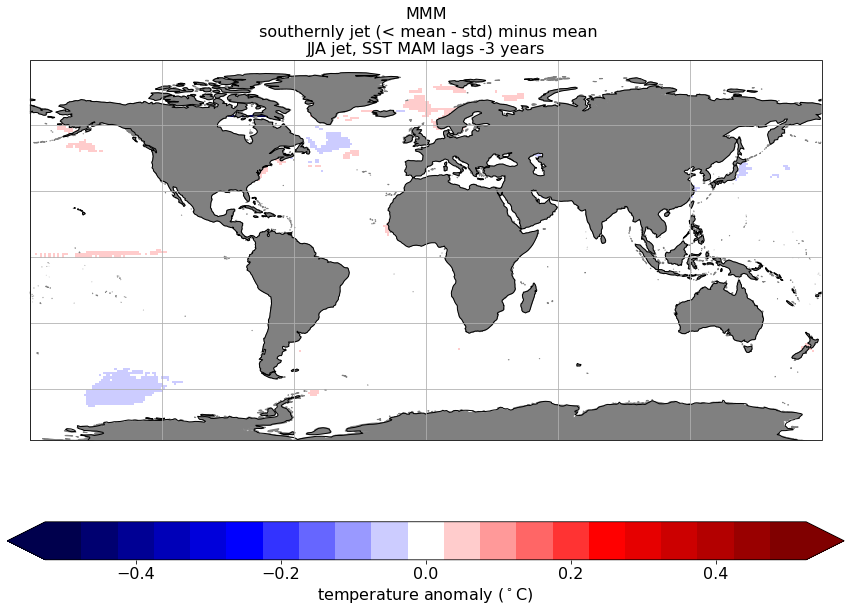

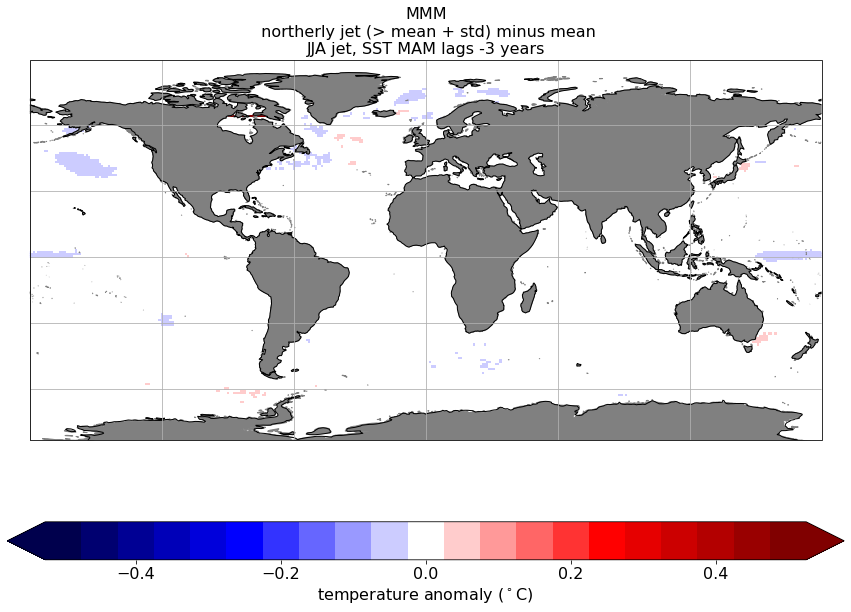

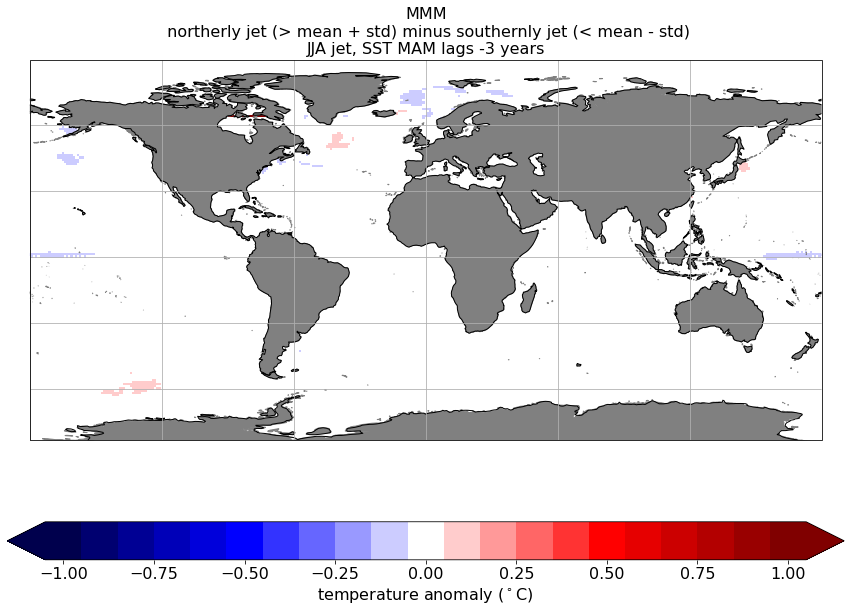

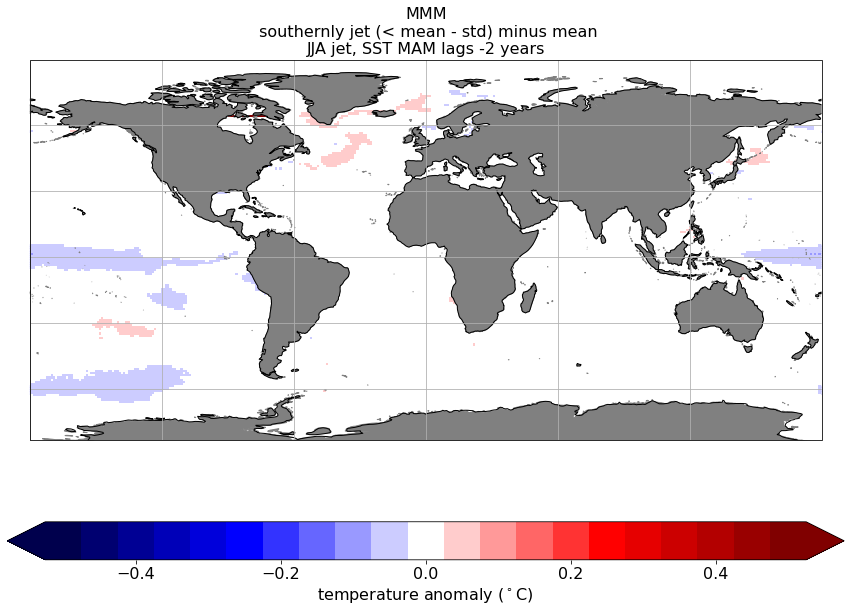

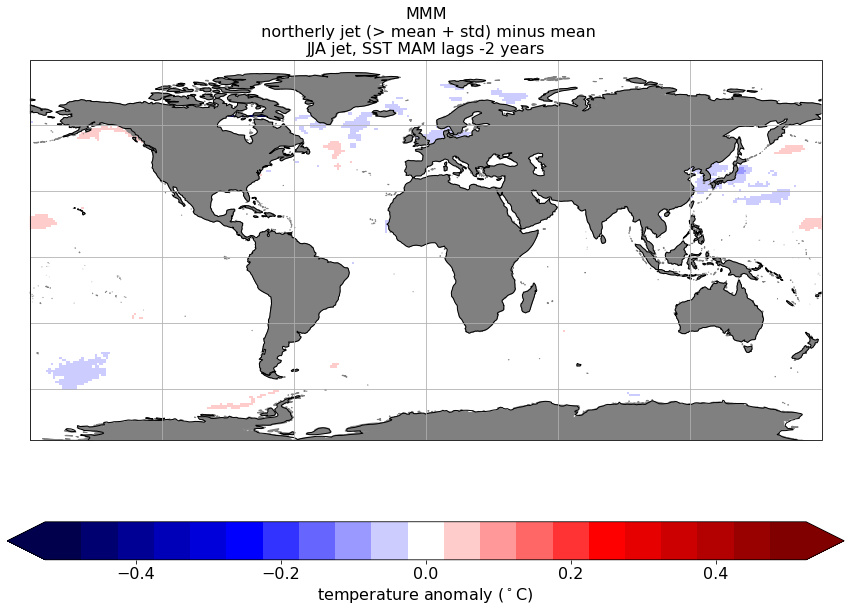

...

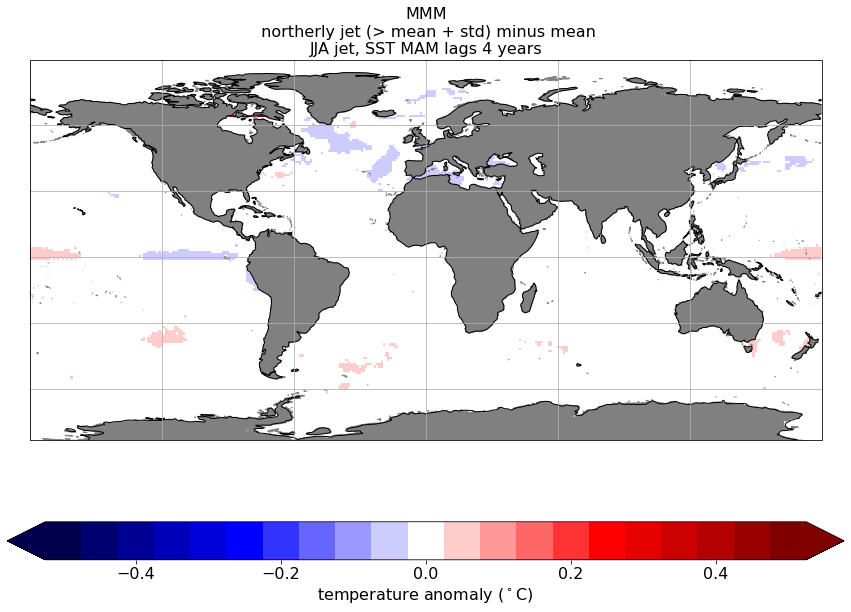

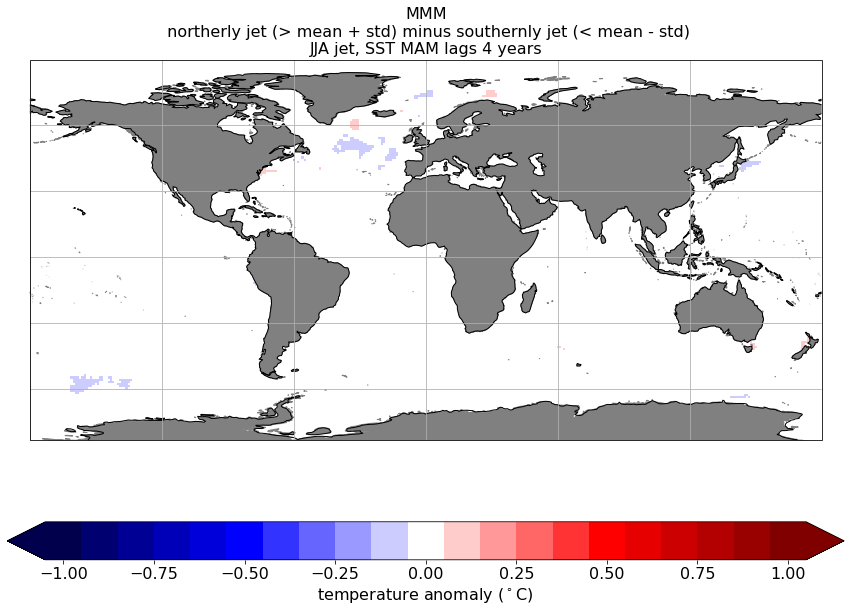

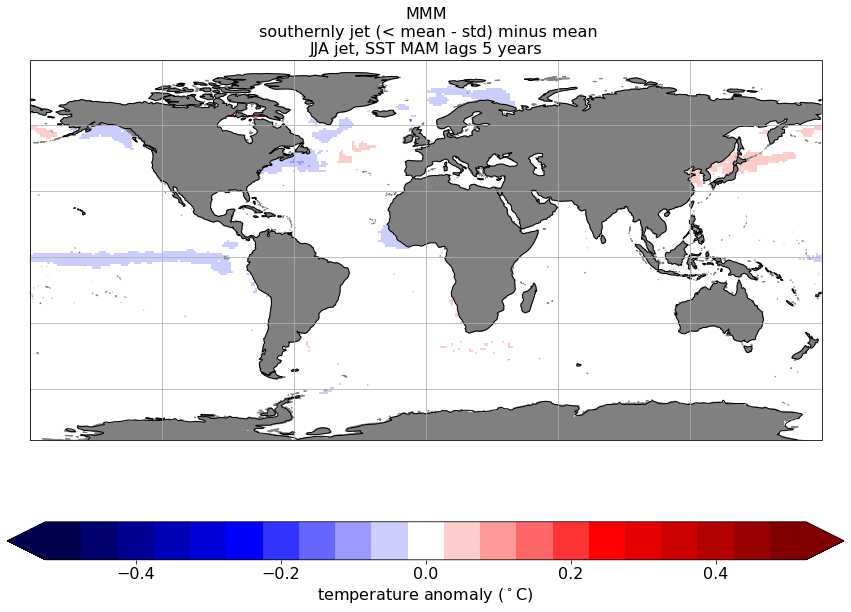

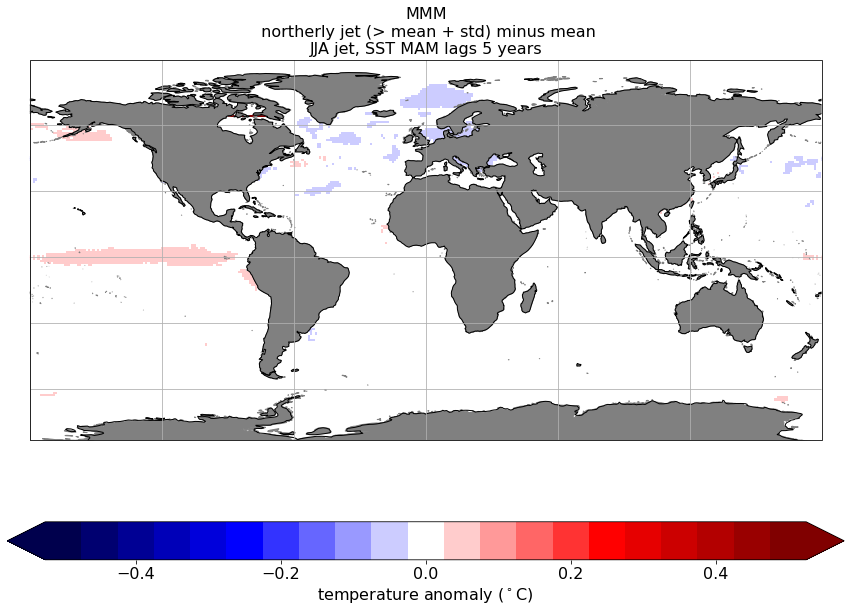

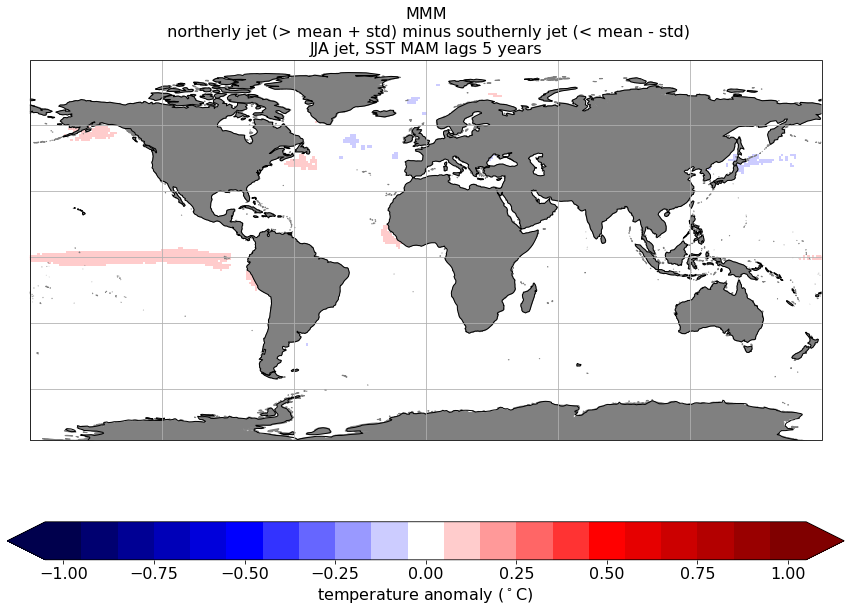

In [18]:
# Loop through each model and plot figures and save MMM:

cmap  = plt.get_cmap('seismic',21)
vmin  = -0.5*1.05
vmax  = 0.5*1.05
vmind = -1*1.05
vmaxd = 1*1.05

mean_MMM = np.zeros((np.size(lat),np.size(lon)),'float')
min1_MMM = np.zeros((np.size(lat),np.size(lon)),'float')
max1_MMM = np.zeros((np.size(lat),np.size(lon)),'float')

cc = 0
for mm in range(0,nm):
    print(models[mm])
    model = models[mm].split('_')[0]
    ENS   = models[mm].split('_')[1]
    
    ncid      = Dataset(infile,'r')
    data_mean = ncid.variables['mean'][mm,:,:]
    data_min1 = ncid.variables['min_std1'][mm,:,:,:]
    data_max1 = ncid.variables['max_std1'][mm,:,:,:]
    ncid.close()

    if ((models[mm] == 'CESM2-FV2_r1i1p1f1') | (models[mm] == 'NESM3_r1i1p1f1')):  # Problem with this model - need to investigate!
        print('problem ' + models[mm])
    else:
        cc = cc + 1
        mean_MMM = mean_MMM + data_mean
        min1_MMM = min1_MMM + data_min1
        max1_MMM = max1_MMM + data_max1
    # Plot individual models:
    '''
    for ll in range(0,nl):
        plot_globaly(data_min1[ll,:,:]-data_mean,'temperature anomaly ($^\circ$C)',16,
                     (model + ' ' + ENS + '\n southernly jet (< mean - std) minus mean\n' + season_ts +
                     ' jet, SST ' + season_field + ' lags ' + str(int(lags[ll])) + ' years'),
                     (figdir + '/' + models[mm] + '_' + var_ts + '-' + season_ts + '_' + var_field +
                     '-' + season_field + '_min-mean_1std_lag' + str(int(lags [ll])) + '.png'),vmin,vmax)

        plot_globaly(data_max1[ll,:,:]-data_mean,'temperature anomaly ($^\circ$C)',16,
                     (model + ' ' + ENS + '\n northerly jet (> mean + std) minus mean\n' + season_ts +
                     ' jet, SST ' + season_field + ' lags ' + str(int(lags[ll])) + ' years'),
                     (figdir + '/' + models[mm] + '_' + var_ts + '-' + season_ts + '_' + var_field +
                     '-' + season_field + '_max-mean_1std_lag' + str(int(lags [ll])) + '.png'),vmin,vmax)

        plot_globaly(data_max1[ll,:,:]-data_min1[ll,:,:],'temperature anomaly ($^\circ$C)',16,
                     (model + ' ' + ENS + '\n northerly jet (> mean + std) minus southernly jet (< mean - std)\n' + season_ts +
                     ' jet, SST ' + season_field + ' lags ' + str(int(lags[ll])) + ' years'),
                     (figdir + '/' + models[mm] + '_' + var_ts + '-' + season_ts + '_' + var_field +
                     '-' + season_field + '_max-min_1std_lag' + str(int(lags [ll])) + '.png'),vmind,vmaxd)
    '''
        
mean_MMM = mean_MMM/cc
min1_MMM = min1_MMM/cc
max1_MMM = max1_MMM/cc  
print(cc)   

# Plot multi-model mean:
for ll in range(0,nl):        
    plot_globaly(min1_MMM[ll,:,:]-mean_MMM,'temperature anomaly ($^\circ$C)',16,
                 ('MMM\n southernly jet (< mean - std) minus mean\n' + season_ts +
                 ' jet, SST ' + season_field + ' lags ' + str(int(lags[ll])) + ' years'),
                 (figdir + '/' + 'MMM_' + var_ts + '-' + season_ts + '_' + var_field +
                 '-' + season_field + '_min-mean_1std_lag' + str(int(lags [ll])) + '.png'),vmin,vmax)

    plot_globaly(max1_MMM[ll,:,:]-mean_MMM,'temperature anomaly ($^\circ$C)',16,
                 ('MMM\n northerly jet (> mean + std) minus mean\n' + season_ts +
                 ' jet, SST ' + season_field + ' lags ' + str(int(lags[ll])) + ' years'),
                 (figdir + '/' + 'MMM_' + var_ts + '-' + season_ts + '_' + var_field +
                 '-' + season_field + '_max-mean_1std_lag' + str(int(lags [ll])) + '.png'),vmin,vmax)

    plot_globaly(max1_MMM[ll,:,:]-min1_MMM[ll,:,:],'temperature anomaly ($^\circ$C)',16,
                 ('MMM\n northerly jet (> mean + std) minus southernly jet (< mean - std)\n' + season_ts +
                 ' jet, SST ' + season_field + ' lags ' + str(int(lags[ll])) + ' years'),
                 (figdir + '/' + 'MMM_' + var_ts + '-' + season_ts + '_' + var_field +
                  '-' + season_field + '_max-min_1std_lag' + str(int(lags [ll])) + '.png'),vmind,vmaxd)

ACCESS-CM2_r1i1p1f1
ACCESS-CM2_r1i1p1f1 has no fields
ACCESS-ESM1-5_r1i1p1f1
BCC-CSM2-MR_r1i1p1f1
BCC-ESM1_r1i1p1f1
CAMS-CSM1-0_r1i1p1f1
CAS-ESM2-0_r1i1p1f1
CAS-ESM2-0_r1i1p1f1 has no fields
CESM2_r1i1p1f1
CESM2-FV2_r1i1p1f1
problem CESM2-FV2_r1i1p1f1
CESM2-WACCM_r1i1p1f1
CESM2-WACCM-FV2_r1i1p1f1
CIESM_r1i1p1f1
CMCC-CM2-SR5_r1i1p1f1
CNRM-CM6-1_r1i1p1f2
CNRM-CM6-1_r1i1p1f2 has no fields
CNRM-CM6-1-HR_r1i1p1f2
CNRM-ESM2-1_r1i1p1f2
CNRM-ESM2-1_r1i1p1f2 has no fields
CanESM5_r1i1p1f1
CanESM5_r1i1p2f1
EC-Earth3_r1i1p1f1
EC-Earth3-AerChem_r1i1p1f1
EC-Earth3-Veg_r1i1p1f1
EC-Earth3-Veg-LR_r1i1p1f1
FGOALS-f3-L_r1i1p1f1
FGOALS-g3_r1i1p1f1
FIO-ESM-2-0_r1i1p1f1
GFDL-CM4_r1i1p1f1
GFDL-CM4_r1i1p1f1 has no fields
HadGEM3-GC31-LL_r1i1p1f1
HadGEM3-GC31-MM_r1i1p1f1
IPSL-CM6A-LR_r1i1p1f1
IPSL-CM6A-LR_r1i2p1f1
MCM-UA-1-0_r1i1p1f1
MIROC-ES2L_r1i1p1f2
MIROC-ES2L_r1i1p1f2 has no fields
MIROC6_r1i1p1f1
MPI-ESM-1-2-HAM_r1i1p1f1
MPI-ESM1-2-HR_r1i1p1f1
MPI-ESM1-2-LR_r1i1p1f1
MRI-ESM2-0_r1i1p1f1
NESM3_r1i1p1f1
pr

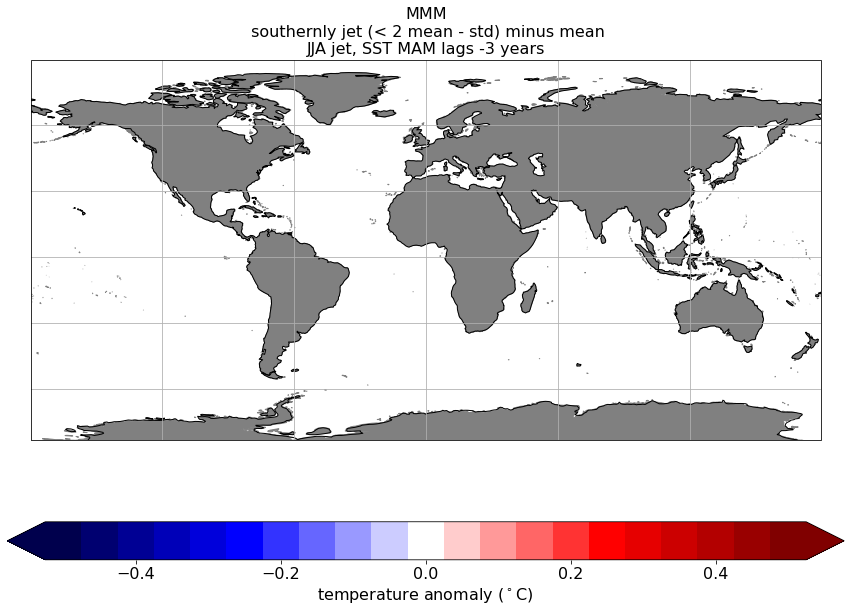

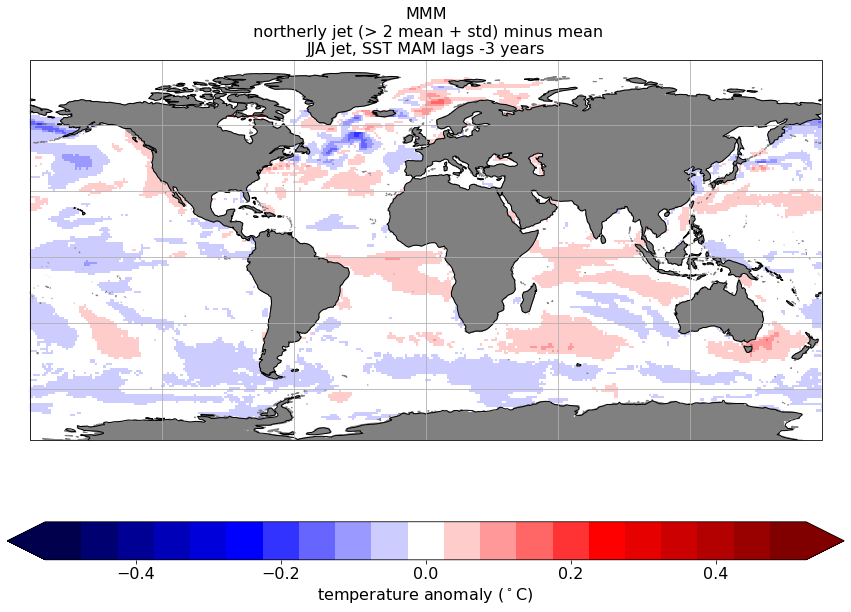

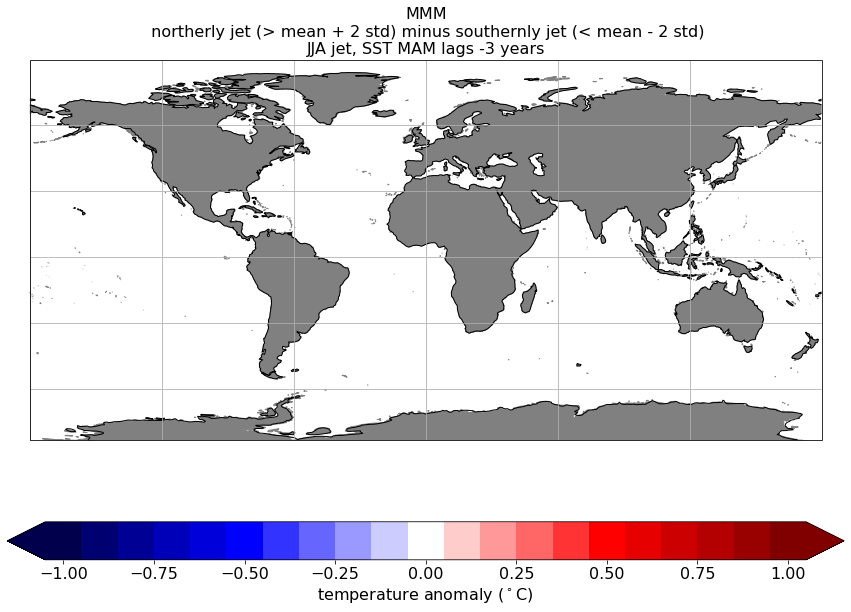

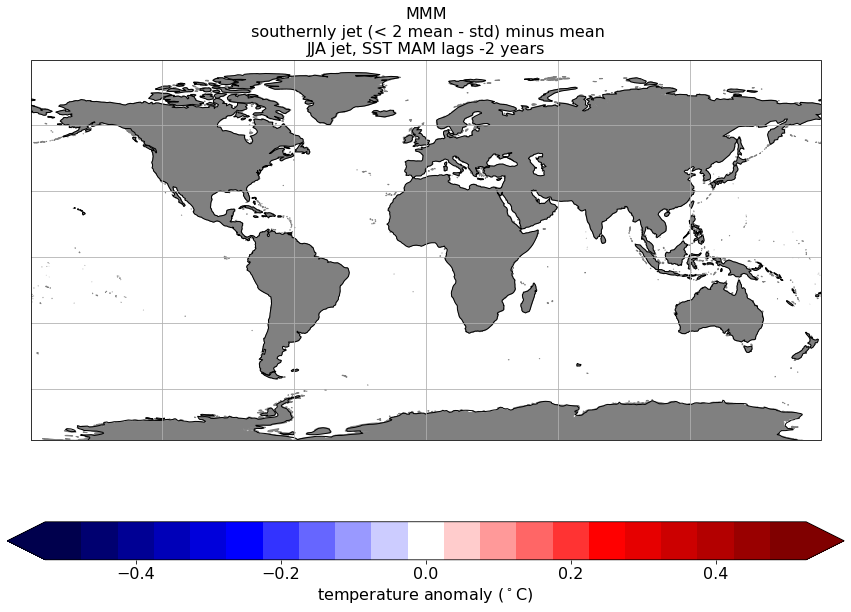

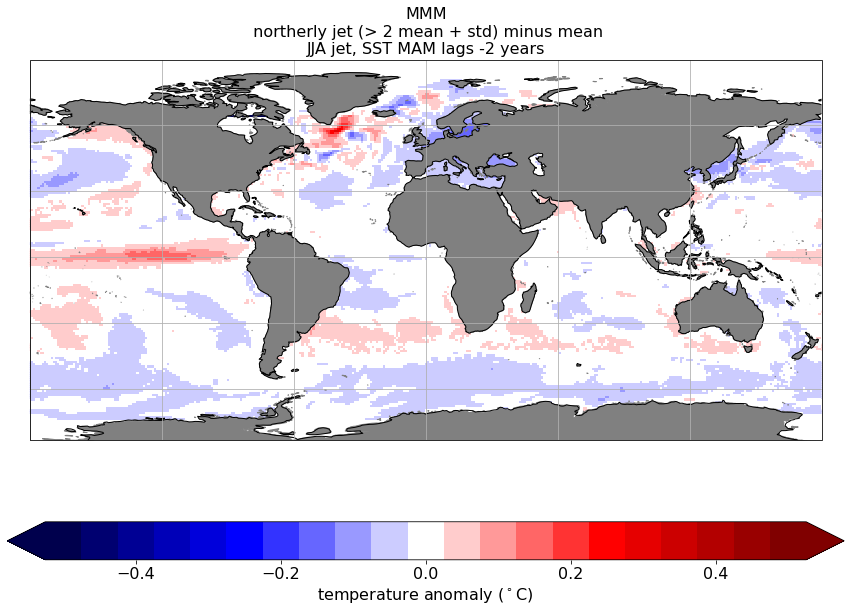

...

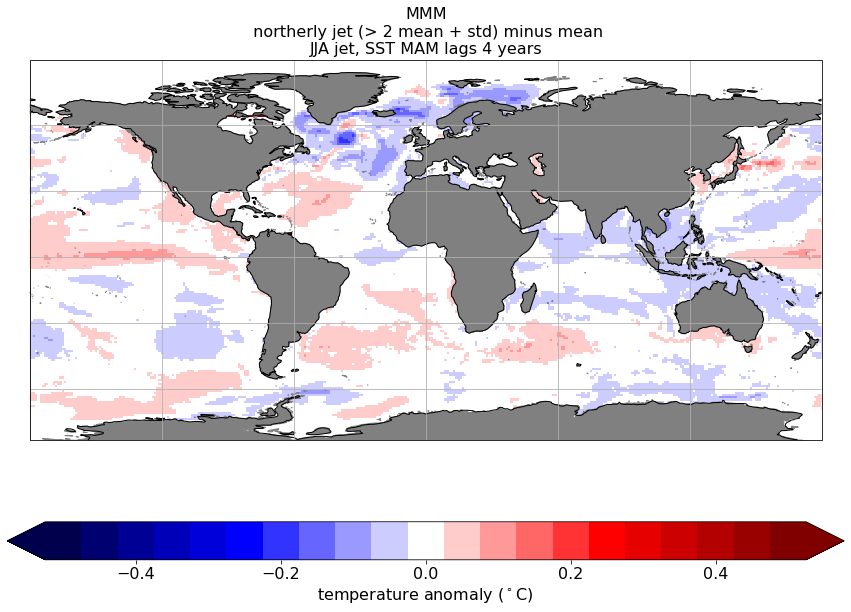

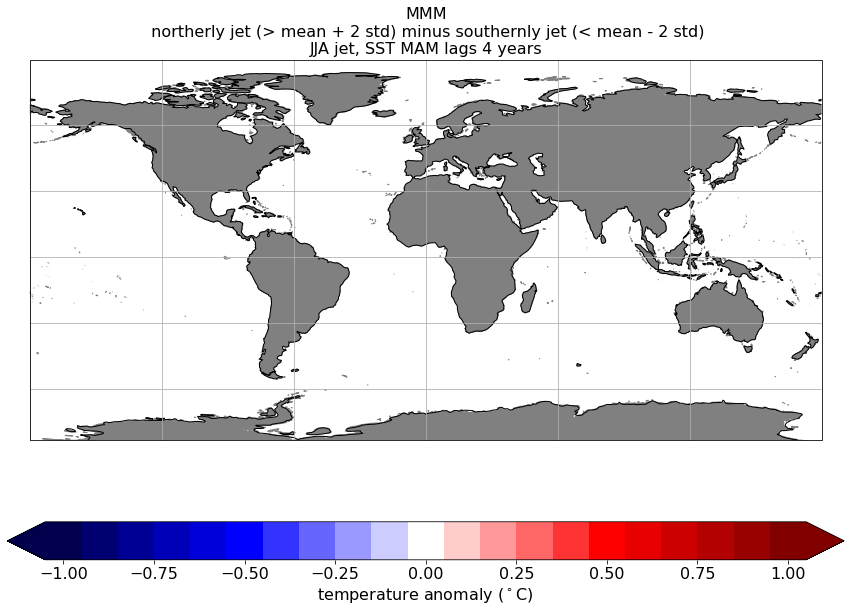

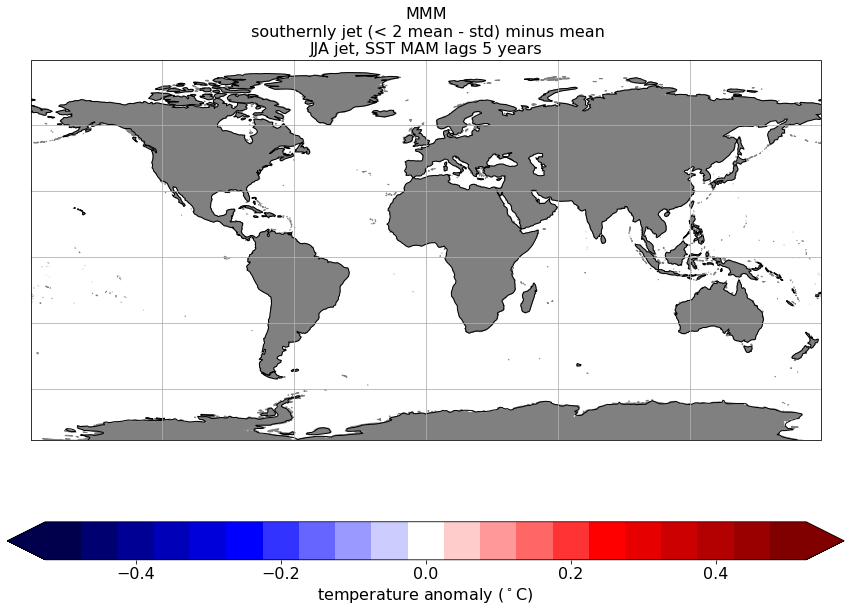

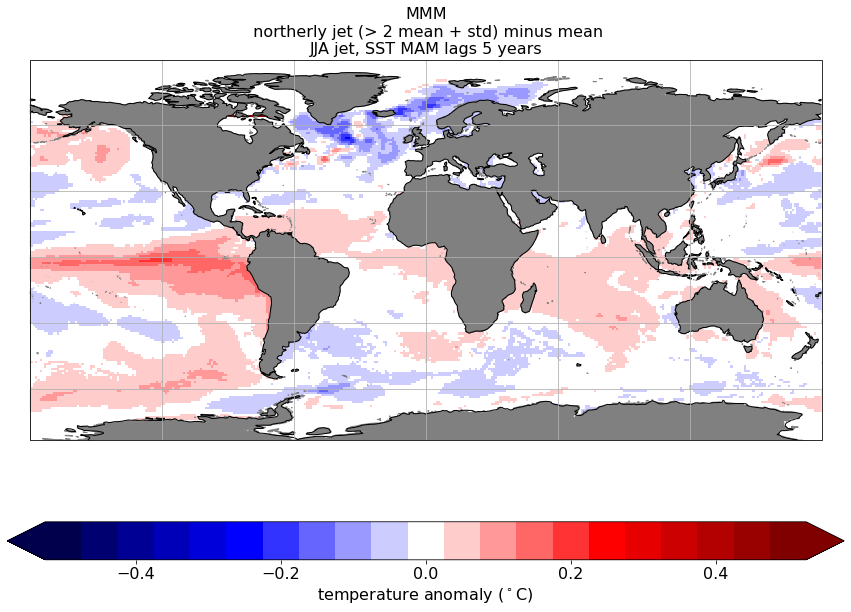

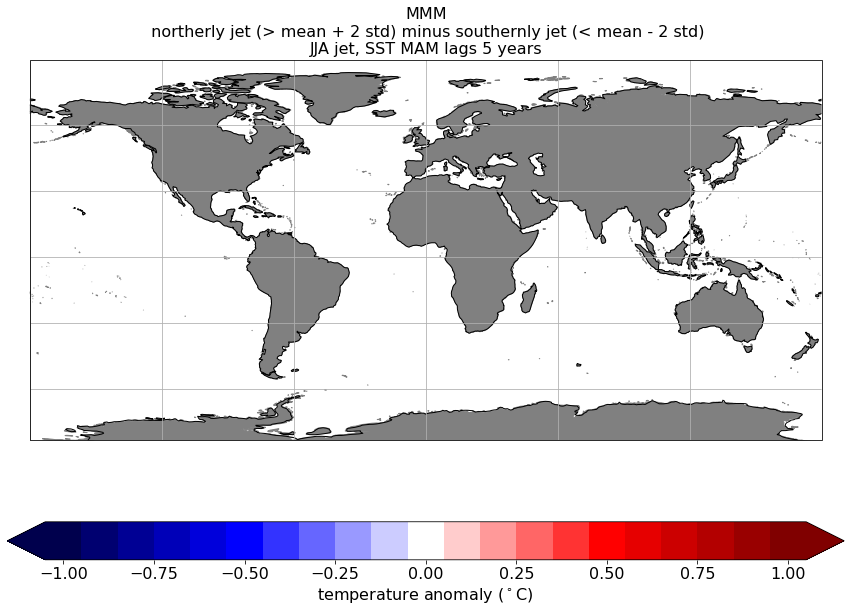

In [19]:
# Loop through each model and plot figures and save MMM:

cmap  = plt.get_cmap('seismic',21)
vmin  = -0.5*1.05
vmax  = 0.5*1.05
vmind = -1*1.05
vmaxd = 1*1.05

mean_MMM = np.zeros((np.size(lat),np.size(lon)),'float')
min2_MMM = np.zeros((np.size(lat),np.size(lon)),'float')
max2_MMM = np.zeros((np.size(lat),np.size(lon)),'float')

cc = 0
for mm in range(0,nm):
    print(models[mm])
    model = models[mm].split('_')[0]
    ENS   = models[mm].split('_')[1]
    
    ncid      = Dataset(infile,'r')
    data_mean = ncid.variables['mean'][mm,:,:]
    data_min2 = ncid.variables['min_std2'][mm,:,:,:]
    data_max2 = ncid.variables['max_std2'][mm,:,:,:]
    ncid.close()

    if ((models[mm] == 'ACCESS-CM2_r1i1p1f1') | (models[mm] == 'CAS-ESM2-0_r1i1p1f1') | (models[mm] == 'CNRM-CM6-1_r1i1p1f2') |
       (models[mm] == 'CNRM-ESM2-1_r1i1p1f2') | (models[mm] == 'GFDL-CM4_r1i1p1f1')   | (models[mm] == 'MIROC-ES2L_r1i1p1f2')):
        print(models[mm] + ' has no fields')
    else:
        if ((models[mm] == 'CESM2-FV2_r1i1p1f1') | (models[mm] == 'NESM3_r1i1p1f1')):  # Problem with this model - need to investigate!
            print('problem ' + models[mm])
        else:
            cc = cc + 1
            mean_MMM = mean_MMM + data_mean
            min2_MMM = min2_MMM + data_min2
            max2_MMM = max2_MMM + data_max2
        # Plot individual models:
        '''
        for ll in range(0,nl):
            plot_globaly(data_min2[ll,:,:]-data_mean,'temperature anomaly ($^\circ$C)',16,
                         (model + ' ' + ENS + '\n southernly jet (< mean - 2 std) minus mean\n' + season_ts +
                         ' jet, SST ' + season_field + ' lags ' + str(int(lags[ll])) + ' years'),
                         (figdir + '/' + models[mm] + '_' + var_ts + '-' + season_ts + '_' + var_field +
                         '-' + season_field + '_min-mean_2std_lag' + str(int(lags [ll])) + '.png'),vmin,vmax)

            plot_globaly(data_max2[ll,:,:]-data_mean,'temperature anomaly ($^\circ$C)',16,
                         (model + ' ' + ENS + '\n northerly jet (> mean + 2 std) minus mean\n' + season_ts +
                         ' jet, SST ' + season_field + ' lags ' + str(int(lags[ll])) + ' years'),
                         (figdir + '/' + models[mm] + '_' + var_ts + '-' + season_ts + '_' + var_field +
                         '-' + season_field + '_max-mean_2std_lag' + str(int(lags [ll])) + '.png'),vmin,vmax)

            plot_globaly(data_max2[ll,:,:]-data_min2[ll,:,:],'temperature anomaly ($^\circ$C)',16,
                         (model + ' ' + ENS + '\n northerly jet (> mean + 2 std) minus southernly jet (< mean - 2 std)\n' + season_ts +
                         ' jet, SST ' + season_field + ' lags ' + str(int(lags[ll])) + ' years'),
                         (figdir + '/' + models[mm] + '_' + var_ts + '-' + season_ts + '_' + var_field +
                         '-' + season_field + '_max-min_2std_lag' + str(int(lags [ll])) + '.png'),vmind,vmaxd)
        '''
        
mean_MMM = mean_MMM/cc
min2_MMM = min2_MMM/cc
max2_MMM = max2_MMM/cc   
print(cc)

# Plot multi-model mean:
for ll in range(0,nl):        
    plot_globaly(min2_MMM[ll,:,:]-mean_MMM,'temperature anomaly ($^\circ$C)',16,
                 ('MMM\n southernly jet (< 2 mean - std) minus mean\n' + season_ts +
                 ' jet, SST ' + season_field + ' lags ' + str(int(lags[ll])) + ' years'),
                 (figdir + '/' + 'MMM_' + var_ts + '-' + season_ts + '_' + var_field +
                 '-' + season_field + '_min-mean_2std_lag' + str(int(lags [ll])) + '.png'),vmin,vmax)

    plot_globaly(max2_MMM[ll,:,:]-mean_MMM,'temperature anomaly ($^\circ$C)',16,
                 ('MMM\n northerly jet (> 2 mean + std) minus mean\n' + season_ts +
                 ' jet, SST ' + season_field + ' lags ' + str(int(lags[ll])) + ' years'),
                 (figdir + '/' + 'MMM_' + var_ts + '-' + season_ts + '_' + var_field +
                 '-' + season_field + '_max-mean_2std_lag' + str(int(lags [ll])) + '.png'),vmin,vmax)

    plot_globaly(max2_MMM[ll,:,:]-min2_MMM[ll,:,:],'temperature anomaly ($^\circ$C)',16,
                 ('MMM\n northerly jet (> mean + 2 std) minus southernly jet (< mean - 2 std)\n' + season_ts +
                 ' jet, SST ' + season_field + ' lags ' + str(int(lags[ll])) + ' years'),
                 (figdir + '/' + 'MMM_' + var_ts + '-' + season_ts + '_' + var_field +
                  '-' + season_field + '_max-min_2std_lag' + str(int(lags [ll])) + '.png'),vmind,vmaxd)